In [1]:
%pwd

'/home/bc/Desktop/Documents/sd_clustering/notebooks'

In [2]:
%cd ..

/home/bc/Desktop/Documents/sd_clustering


In [3]:
%pwd

'/home/bc/Desktop/Documents/sd_clustering'

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from pyspark.sql import SparkSession
from spark.pca_cluster import run_clustering 
from src.generate_images import generate_images
from src.extract_embeddings import extract_embeddings
from paths.paths import results_dir, prompts_file, images_dir
from matplotlib.lines import Line2D
from matplotlib.patches import Patch 
from PIL import Image

/home/bc/anaconda3/envs/sd_clustering/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
spark = SparkSession.builder.appName("notebook").getOrCreate()

Using Spark's default log4j profile: org/apache/spark/log4j2-defaults.properties
25/08/01 01:34:12 WARN Utils: Your hostname, bc, resolves to a loopback address: 127.0.1.1; using 192.168.0.6 instead (on interface wlp3s0)
25/08/01 01:34:12 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Using Spark's default log4j profile: org/apache/spark/log4j2-defaults.properties
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/08/01 01:34:13 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


Generate images from predefined prompts. Prompt are in /data/prompts.txt file.

In [6]:
generate_images()

100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


Using CLIP model get embeddings (512 dimensional vectors) of these images and save them in parquet format.

In [7]:
extract_embeddings()

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Using spark read embeddings from parquet file. Perform dimensionality reduction to 2 and then perform k means clustering. Find centers of clusters and points that are the furthest from centers in given cluster. Lastly save data in parquet format using partitioning by clusters.

In [8]:
run_clustering(spark)

25/08/01 01:48:42 WARN SparkStringUtils: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


Read data frame which contains informations about embedding, prompts and PCA.

In [9]:
df_clustered = pd.read_parquet(str(results_dir / "clustered"))
df_furthest = pd.read_parquet(str(results_dir / "furthest"))

Read prompts.

In [10]:
with prompts_file.open("r") as f:
    prompts = [line.strip() for line in f if line.strip()]

Utility chunk.

In [11]:
marker_map = {
    prompts[0]: 'o',   
    prompts[1]: 's',   
    prompts[2]: '^'    
}

clusters = sorted(df_clustered['cluster'].unique())
cmap = plt.cm.get_cmap('Set1', len(clusters))

Plot principal components coordinates. Colors indicate k means clusters. Shapes indicate prompts. 

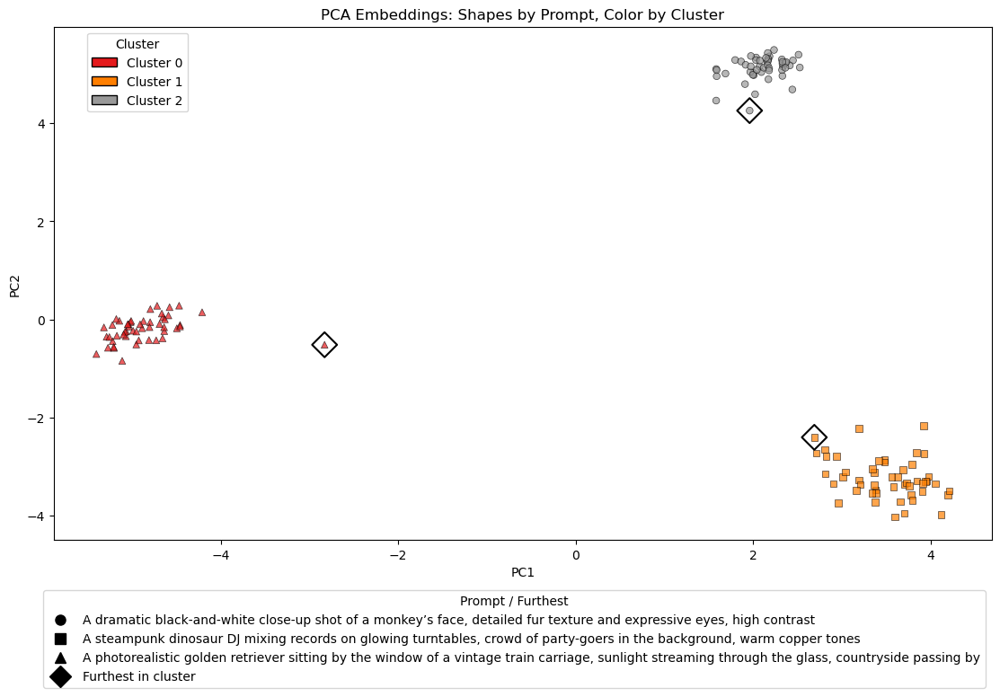

In [12]:
plt.figure(figsize=(12,8))
for prompt in prompts:
    subset = df_clustered[df_clustered['prompt'] == prompt]
    plt.scatter(
        subset['pca1'], subset['pca2'],
        c=subset['cluster'],
        cmap=cmap,
        vmin=clusters[0], vmax=clusters[-1],
        marker=marker_map[prompt],
        s=30, alpha=0.7,
        edgecolor='k', linewidth=0.5
    )

plt.scatter(
    df_furthest['pca1'], df_furthest['pca2'],
    marker='D', s=200,
    facecolors='none', edgecolors='black', linewidths=1.5,
    label='Furthest in cluster'
)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA Embeddings: Shapes by Prompt, Color by Cluster')

cluster_patches = [Patch(facecolor=cmap(i), edgecolor='k', label=f'Cluster {i}') for i in clusters]
leg1 = plt.legend(handles=cluster_patches, title='Cluster', loc='upper right', bbox_to_anchor=(0.15, 1))
plt.gca().add_artist(leg1)

prompt_handles = [Line2D([0], [0], marker=marker_map[p], color='black', linestyle='None', markersize=8, label=p) for p in prompts]
prompt_handles.append(Line2D([0], [0], marker='D', color='black', linestyle='None', markersize=12, label='Furthest in cluster'))
plt.legend(handles=prompt_handles, title='Prompt / Furthest', loc='lower right', bbox_to_anchor=(1, -0.3))

plt.tight_layout()
plt.show()

We can now see images which are outliers. My hyphotesis is that these images will be less faithfull to the standard ones to prompts from which they were generated.

This is a "weird" one.

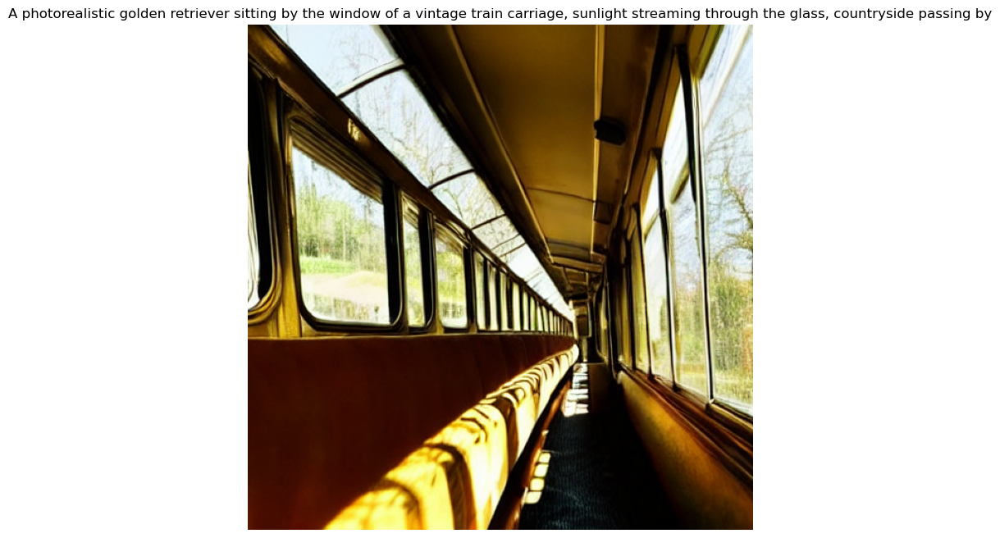

In [13]:
prompt_with_spaces = df_furthest["prompt"].iloc[0]
prompt_without_spaces = prompt_with_spaces.replace(" ", "_")
img_path = images_dir / prompt_without_spaces / df_furthest["filename"].iloc[0]
img = plt.imread(img_path)
plt.figure(figsize=(8, 8))
plt.imshow(img)
plt.axis('off')
plt.title(prompt_with_spaces, fontsize=12, wrap=True)   
plt.show()

Now let's pick a few different images from same prompt.

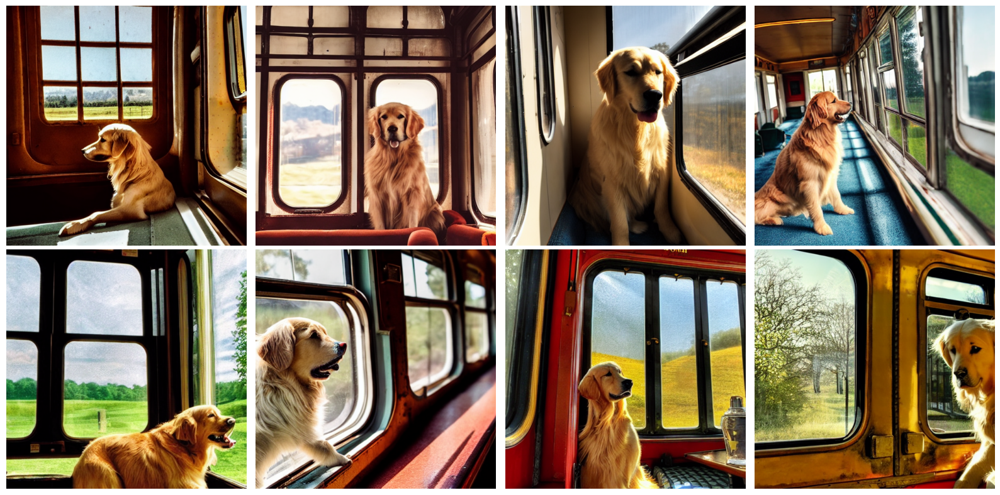

In [15]:
indices = list(range(10, 18))
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

prompt_with_spaces = df_clustered["prompt"].iloc[0]
prompt_without_spaces = prompt_with_spaces.replace(" ", "_")

for ax, idx in zip(axes.flatten(), indices):

    img_path = images_dir / prompt_without_spaces / df_clustered["filename"].iloc[idx]
    img = plt.imread(img_path)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()


Do the same experiment on two other prompts.

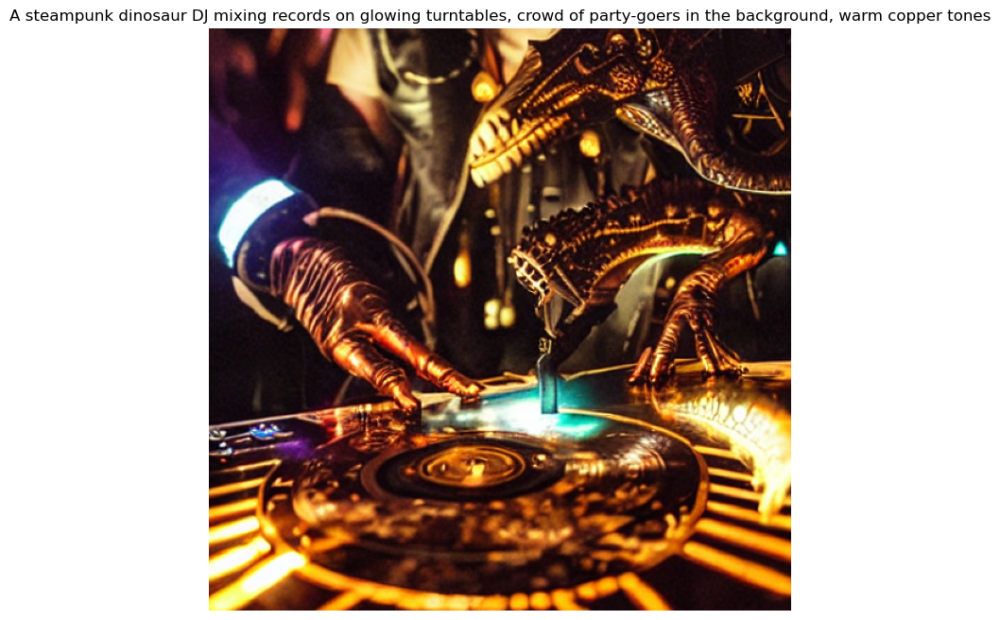

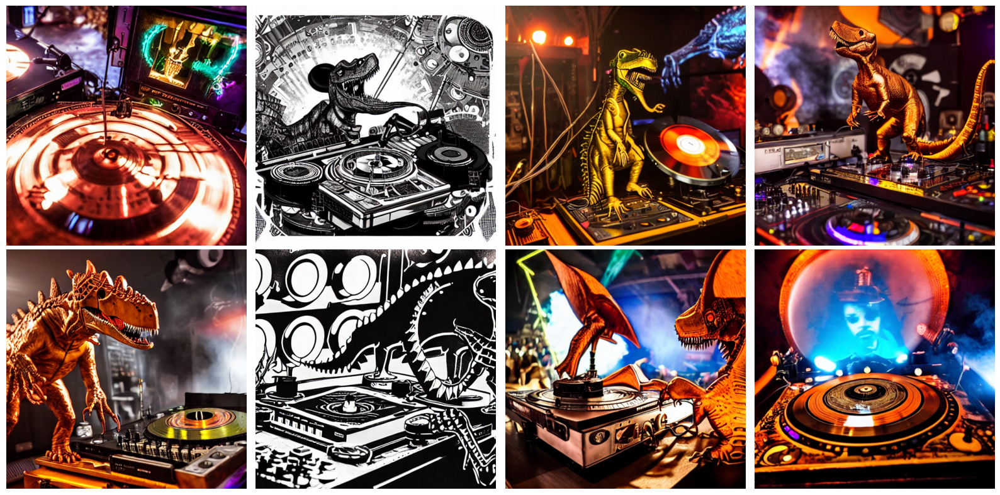

In [16]:
prompt_with_spaces = df_furthest["prompt"].iloc[1]
prompt_without_spaces = prompt_with_spaces.replace(" ", "_")
img_path = images_dir / prompt_without_spaces / df_furthest["filename"].iloc[1]
img = plt.imread(img_path)
plt.figure(figsize=(8, 8))
plt.imshow(img)
plt.axis('off')
plt.title(prompt_with_spaces, fontsize=12, wrap=True)   
plt.show()

indices = list(range(26, 34))
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

prompt_with_spaces = df_furthest["prompt"].iloc[1]
prompt_without_spaces = prompt_with_spaces.replace(" ", "_")

for ax, idx in zip(axes.flatten(), indices):

    img_path = images_dir / prompt_without_spaces / df_clustered["filename"].iloc[idx]
    img = plt.imread(img_path)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()



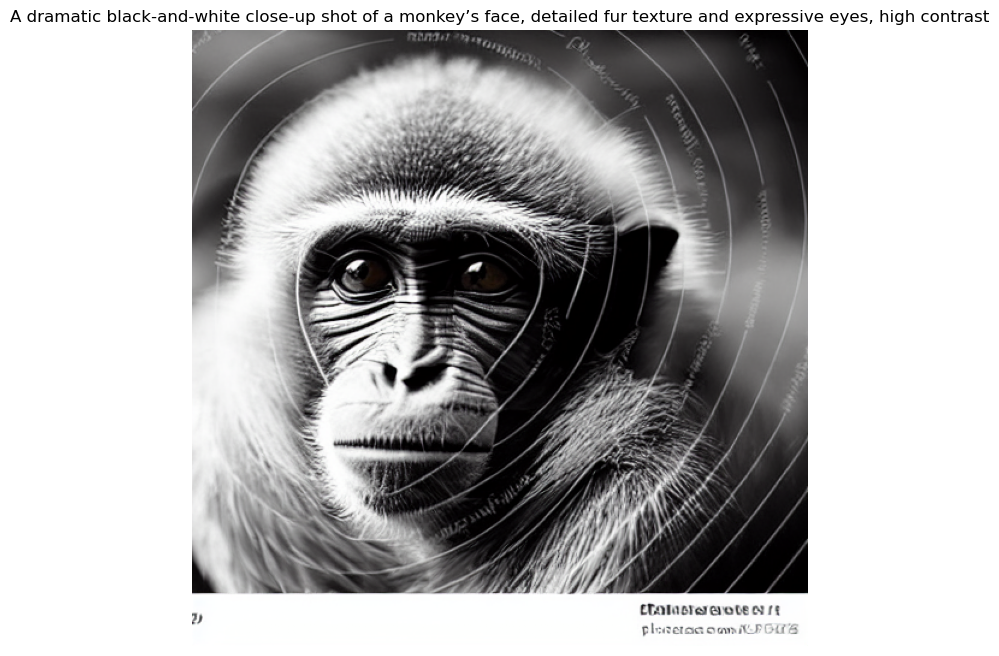

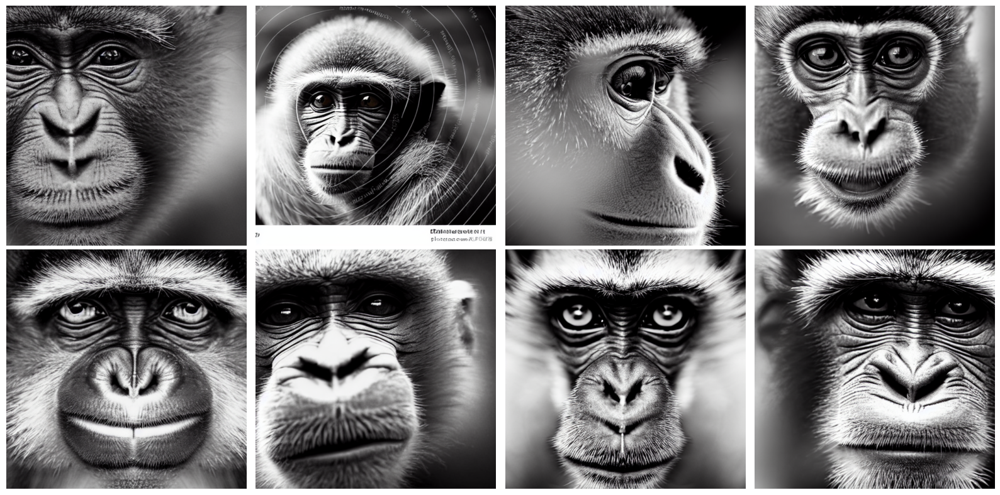

In [17]:
prompt_with_spaces = df_furthest["prompt"].iloc[2]
prompt_without_spaces = prompt_with_spaces.replace(" ", "_")
img_path = images_dir / prompt_without_spaces / df_furthest["filename"].iloc[2]
img = plt.imread(img_path)
plt.figure(figsize=(8, 8))
plt.imshow(img)
plt.axis('off')
plt.title(prompt_with_spaces, fontsize=12, wrap=True)   
plt.show()

indices = list(range(15, 23))
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

prompt_with_spaces = df_furthest["prompt"].iloc[2]
prompt_without_spaces = prompt_with_spaces.replace(" ", "_")

for ax, idx in zip(axes.flatten(), indices):

    img_path = images_dir / prompt_without_spaces / df_clustered["filename"].iloc[idx]
    img = plt.imread(img_path)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()

In the dog example it is clear that the photo does not match a prompt. This can't be said about dinosaur example. Monkey "odd" example has these concentric circles which probably cause it to be an outlier, however they can be seen on other photo too.